In [1]:
# import libriaries
import calendar
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import rioxarray
import rasterio.features
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import cdsapi

The code snippet demonstrates how to leverage Python for statistical and geospatial data analytics!  
The core libraries and their uses are:

**calendar:**  
Provides utilities related to calendars and dates, like getting month names, day of week, leap year checks, etc. Useful when working with time series data or formatting dates.

**numpy:**  
Fundamental package for numerical computing in Python — arrays, math functions, linear algebra, random numbers, etc.

**pandas:**  
For data manipulation and analysis, especially tabular data (like spreadsheets or CSVs). Great for handling time series, grouping, and joining datasets.

**xarray:**  
For working with multi-dimensional labeled arrays, often used in climate, hydrological, remote sensing, and geospatial data (e.g., NetCDF files). Great for working with data cubes over space and time.

**geopandas:**  
Extends pandas to support spatial/geographic data, making it easier to handle vector data (points, lines, polygons).

**rioxarray:**  
Adds raster-specific functionality to xarray, such as reading/writing georeferenced raster files (GeoTIFFs) and handling spatial metadata.

**rasterio.features:**  
Part of rasterio, useful for working with raster data, including features like rasterizing vector geometries and extracting shapes from rasters.

**matplotlib.pyplot:**  
Core plotting library in Python, used to create static, animated, and interactive visualizations.

**matplotlib.colors (as mcolors):**  
Utilities related to color specification and manipulation in matplotlib plots (e.g., creating custom colormaps).

**seaborn:**  
Statistical data visualization library built on matplotlib. Provides prettier and easier-to-make charts and plots.

**cdsapi:**  
Client library to interact with the Copernicus Climate Data Store API — useful for downloading climate data like ERA5 or other datasets directly from the web.

We start with a randomly generated time series!

In [2]:
# Set seed for reproducibility
np.random.seed(42)

# Generate synthetic data
n = 200  # number of samples
x = np.random.normal(loc=50, scale=10, size=n)       # e.g. 'Study Hours'
y = 2.5 * x + np.random.normal(loc=0, scale=15, size=n)  # e.g. 'Test Score'

# Add some categorical variable
group = np.random.choice(['Group A', 'Group B'], size=n)

# Put into DataFrame
df = pd.DataFrame({
    'StudyHours': x,
    'TestScore': y,
    'Group': group
})

df.head()

,StudyHours,TestScore,Group
0,54.967142,142.784664,Group A
1,48.617357,129.955160,Group A
2,56.476885,157.437982,Group A
3,65.230299,178.882777,Group A
4,47.658466,98.481125,Group B


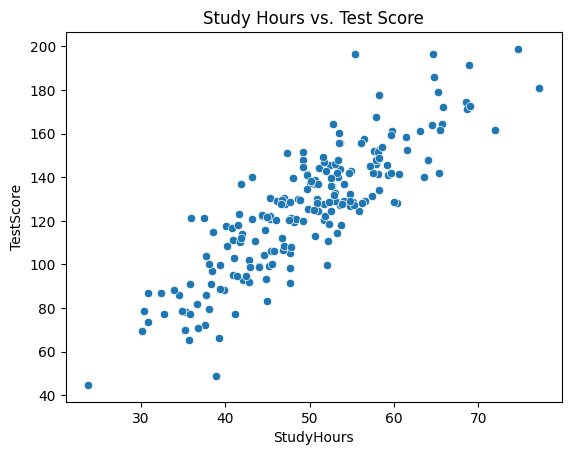

In [3]:
sns.scatterplot(data=df, x='StudyHours', y='TestScore')
plt.title("Study Hours vs. Test Score")
plt.show()

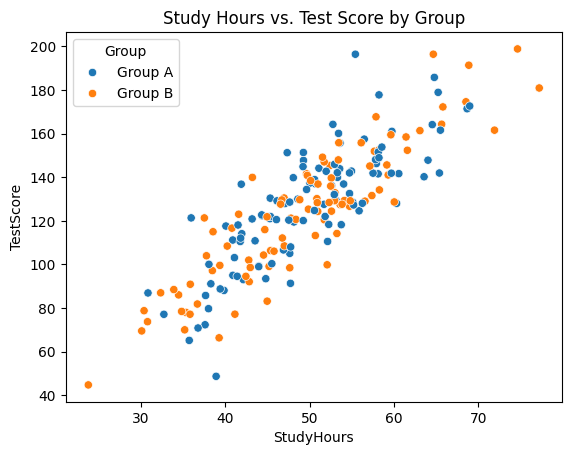

In [4]:
sns.scatterplot(data=df, x='StudyHours', y='TestScore', hue='Group')
plt.title("Study Hours vs. Test Score by Group")
plt.show()

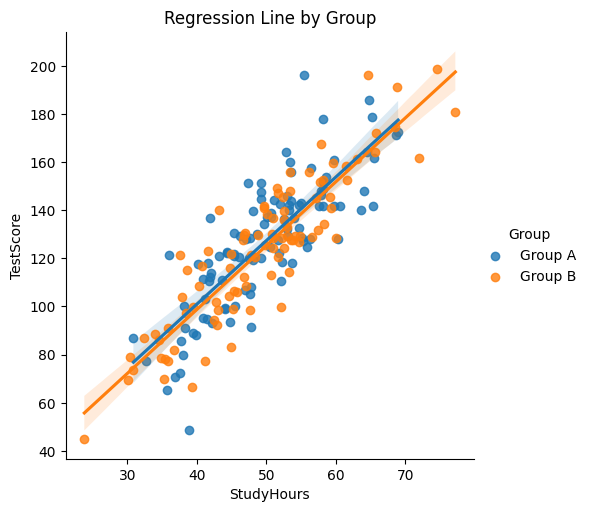

In [5]:
sns.lmplot(data=df, x='StudyHours', y='TestScore', hue='Group')
plt.title("Regression Line by Group")
plt.show()

In [6]:

# Parameters
years = np.arange(2015, 2024)  # 2015 to 2023
months = np.arange(1, 13)      # Jan to Dec

# Create a DataFrame with all year-month combinations
date_index = pd.date_range(start=f'{years[0]}-01-01', end=f'{years[-1]}-12-31', freq='MS')
df = pd.DataFrame({'Year': date_index.year, 'Month': date_index.month})

# Generate synthetic flight counts with some seasonality and random noise
np.random.seed(42)
base_flights = 1000
seasonality = [0.8, 0.85, 0.9, 1, 1.1, 1.3, 1.5, 1.4, 1.2, 1, 0.9, 0.85]  # low in winter, high in summer

df['Flights'] = [
    int(base_flights * seasonality[month-1] * (1 + 0.05*np.random.randn()))
    for month in df['Month']
]

df.head(15)


,Year,Month,Flights
0,2015,1,819
1,2015,2,844
2,2015,3,929
3,2015,4,1076
4,2015,5,1087
5,2015,6,1284
6,2015,7,1618
7,2015,8,1453
8,2015,9,1171
9,2015,10,1027


In [7]:
heatmap_data = df.pivot(index='Year', columns='Month', values='Flights')
heatmap_data.columns = [pd.to_datetime(f'2024-{m}-01').strftime('%b') for m in heatmap_data.columns]  # Month names

heatmap_data.head()


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Year,,,,,,,,,,,,
2015,819,844,929,1076,1087,1284,1618,1453,1171,1027,879,830
2016,809,768,822,971,1044,1320,1431,1301,1287,988,903,789
2017,778,854,848,1018,1066,1281,1454,1529,1199,947,937,798
2018,808,766,840,1009,1140,1311,1491,1378,1111,964,879,894
2019,813,775,914,980,1062,1339,1577,1465,1149,984,914,891


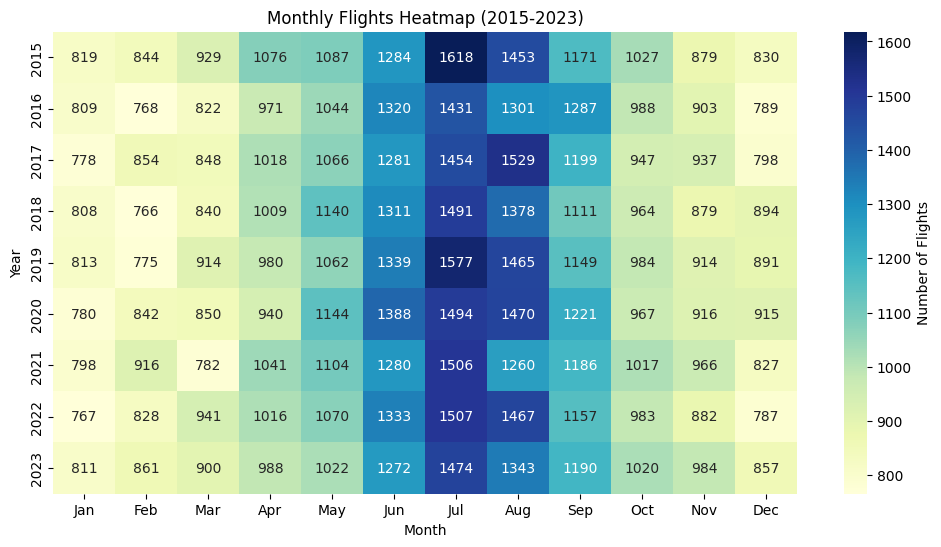

In [8]:

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="YlGnBu", cbar_kws={'label': 'Number of Flights'})
plt.title("Monthly Flights Heatmap (2015-2023)")
plt.ylabel("Year")
plt.xlabel("Month")
plt.show()



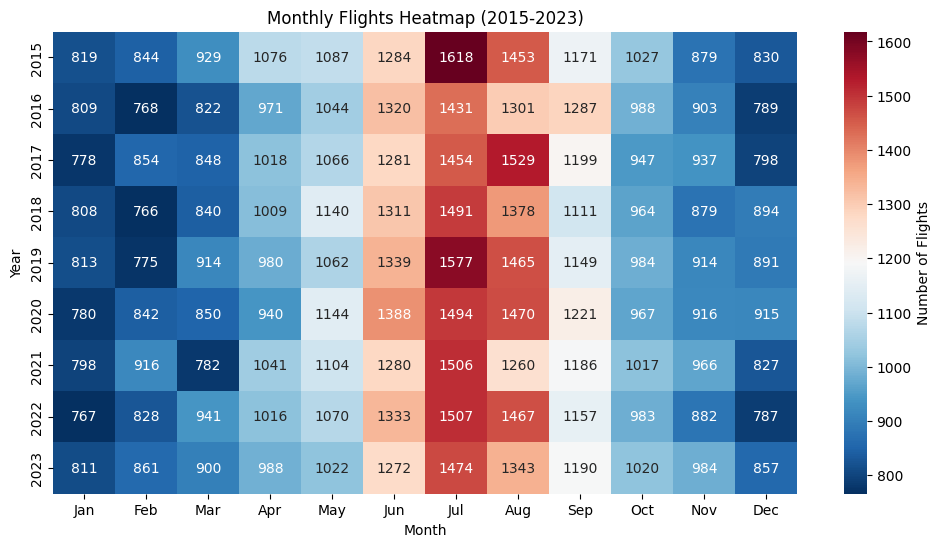

In [9]:

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="RdBu_r", cbar_kws={'label': 'Number of Flights'})
plt.title("Monthly Flights Heatmap (2015-2023)")
plt.ylabel("Year")
plt.xlabel("Month")
plt.show()

In [10]:
# We'll reuse 'df' from before with Year and Month

# Typical northern hemisphere seasonal temps (°C) - warmer in summer, colder in winter
avg_temps = [0, 2, 6, 12, 18, 22, 25, 24, 19, 13, 7, 2]

# Add some random noise and a slight upward trend over years (e.g., +0.1°C per year)
np.random.seed(42)
df['Temperature'] = [
    avg_temps[month-1] + 0.1*(year - years[0]) + np.random.normal(0, 1.5)
    for year, month in zip(df['Year'], df['Month'])
]

df.head(15)


,Year,Month,Flights,Temperature
0,2015,1,819,0.745071
1,2015,2,844,1.792604
2,2015,3,929,6.971533
3,2015,4,1076,14.284545
4,2015,5,1087,17.648770
5,2015,6,1284,21.648795
6,2015,7,1618,27.368819
7,2015,8,1453,25.151152
8,2015,9,1171,18.295788
9,2015,10,1027,13.813840


In [11]:
temp_heatmap = df.pivot(index='Year', columns='Month', values='Temperature')
temp_heatmap.columns = [pd.to_datetime(f'2024-{m}-01').strftime('%b') for m in temp_heatmap.columns]

temp_heatmap.head()


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Year,,,,,,,,,,,,
2015,0.745071,1.792604,6.971533,14.284545,17.648770,21.648795,27.368819,25.151152,18.295788,13.813840,6.304873,1.301405
2016,0.462943,-0.769920,3.512623,11.256569,16.580753,22.571371,23.737964,21.981544,21.298473,12.761336,7.201292,-0.037122
2017,-0.616574,2.366384,4.473510,12.763547,17.299042,21.762459,24.297440,26.978417,19.179754,11.613434,8.433817,0.368735
2018,0.613295,-0.639505,4.307721,12.595292,19.407700,22.557052,25.126528,23.848344,17.082217,12.220234,6.609042,3.885683
2019,0.915427,-0.244560,6.886126,11.822377,17.384617,23.317514,26.946499,25.796920,18.141174,12.936181,7.896895,3.863318


In [12]:
# Calculate the long-term average temperature for each month (climatology)
climatology = df.groupby('Month')['Temperature'].mean()

# Map the climatology back to each row by month
df['Temp_Climatology'] = df['Month'].map(climatology)

# Calculate anomaly
df['Temp_Anomaly'] = df['Temperature'] - df['Temp_Climatology']

df.head(15)


,Year,Month,Flights,Temperature,Temp_Climatology,Temp_Anomaly
0,2015,1,819,0.745071,0.353234,0.391838
1,2015,2,844,1.792604,1.645825,0.146778
2,2015,3,929,6.971533,5.393685,1.577848
3,2015,4,1076,14.284545,12.544680,1.739865
4,2015,5,1087,17.648770,17.928061,-0.279291
5,2015,6,1284,21.648795,22.686886,-1.038091
6,2015,7,1618,27.368819,25.526491,1.842328
7,2015,8,1453,25.151152,24.569986,0.581166
8,2015,9,1171,18.295788,19.057260,-0.761472
9,2015,10,1027,13.813840,13.069733,0.744107


In [13]:
anomaly_heatmap = df.pivot(index='Year', columns='Month', values='Temp_Anomaly')
anomaly_heatmap.columns = [pd.to_datetime(f'2024-{m}-01').strftime('%b') for m in anomaly_heatmap.columns]
anomaly_heatmap

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Year,,,,,,,,,,,,
2015,0.391838,0.146778,1.577848,1.739865,-0.279291,-1.038091,1.842328,0.581166,-0.761472,0.744107,-1.700234,-0.873957
2016,0.109710,-2.415745,-1.881062,-1.288111,-1.347307,-0.115515,-1.788527,-2.588442,2.241213,-0.308397,-0.803816,-2.212485
2017,-0.969808,0.720559,-0.920175,0.218867,-0.629019,-0.924427,-1.229051,2.408431,0.122494,-1.456299,0.428709,-1.806628
2018,0.260062,-2.285330,-1.085964,0.050612,1.479639,-0.129834,-0.399964,-0.721642,-1.975043,-0.849499,-1.396066,1.710321
2019,0.562194,-1.890385,1.492441,-0.722303,-0.543444,0.630628,1.420008,1.226934,-0.916087,-0.133552,-0.108213,1.687955
2020,-0.571995,0.575686,-0.553188,-1.838990,1.790728,1.847474,-0.134506,1.435313,0.985194,-0.537413,0.036985,2.631692
2021,0.193027,3.301140,-2.723303,1.288174,0.802510,-0.535397,0.211150,-2.951340,0.213232,1.065936,1.811733,-0.352768
2022,-0.865974,0.301539,2.679418,0.648447,-0.022701,0.783015,0.319125,1.582981,-0.410340,0.138774,-0.893270,-1.670635
2023,0.890947,1.545758,1.413985,-0.096561,-1.251117,-0.517854,-0.240563,-0.973402,0.500811,1.336343,2.624171,0.886504


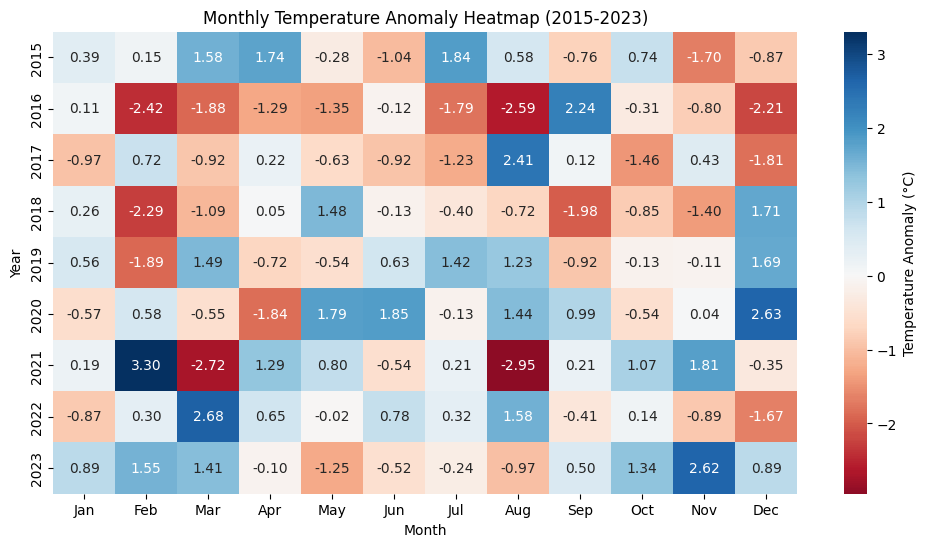

In [14]:
plt.figure(figsize=(12, 6))
sns.heatmap(anomaly_heatmap, annot=True, fmt=".2f", center=0, cmap="RdBu", cbar_kws={'label': 'Temperature Anomaly (°C)'})
plt.title("Monthly Temperature Anomaly Heatmap (2015-2023)")
plt.ylabel("Year")
plt.xlabel("Month")
plt.show()


**The above examples** are based on a **randomly generated dataset**.

We will now explore **real-world examples** to demonstrate how to **leverage and visualize geospatial data** using **Python libraries**.

In these examples, we will:

- **Download** climate time series data from the **Copernicus Climate Data Store (CDS)**  
- **Process** the data over **Bavaria** and its **sub-administrative units**

> **Note:**  
> To run these examples successfully, you will need:
> - Valid **login credentials** for the [Climate Data Store (CDS)](https://cds.climate.copernicus.eu/api-how-to)  
> - **Shapefiles** of Bavaria at **sub-administrative levels**


Now let's get started!
We access and download 2m air temperature from the ERA5-Land reanalysis dataset 
[ERA5-Land Monthly Means Dataset](https://cds.climate.copernicus.eu/datasets/reanalysis-era5-land-monthly-means?tab=overview)
N.B.: We will download the dataset via  Climate Data Store (CDS) Application Program Interface (API) 

In [15]:
# We download 2m air temperature as monthly mean aggregates from ERA5-land reanalysis
dataset = "reanalysis-era5-land-monthly-means"
request = {
    "product_type": ["monthly_averaged_reanalysis"],
    "variable": ["2m_temperature"],
    "year": [
        "2000", "2001", "2002", "2003", "2004", "2005",
        "2006", "2007", "2008", "2009", "2010", "2011",
        "2012", "2013", "2014", "2015", "2016", "2017",
        "2018", "2019", "2020", "2021", "2022", "2023",
        "2024", "2025"
    ],
    "month": [
        "01", "02", "03", "04", "05", "06",
        "07", "08", "09", "10", "11", "12"
    ],
    "time": ["00:00"],
    "data_format": "netcdf",
    "download_format": "unarchived",
    "area": [75, -25, 34, 45]  # North, West, South, East
}

output_path = r"D:\Analytics\project\code_reeves\era5_land_2m_temperature_2000_2025.nc"

client = cdsapi.Client()
client.retrieve(dataset, request).download(output_path)

2025-07-14 09:21:36,626 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-07-14 09:21:36,839 INFO Request ID is 2f6819fc-8dfc-4147-bafa-dd63eb1fd95c
2025-07-14 09:21:36,899 INFO status has been updated to accepted
2025-07-14 09:21:45,347 INFO status has been updated to running
2025-07-14 09:23:31,127 INFO status has been updated to successful


e9a901fb82197721afcfabd1b2d634f1.nc:   0%|          | 0.00/71.5M [00:00<?, ?B/s]

'D:\\Analytics\\project\\code_reeves\\era5_land_2m_temperature_2000_2025.nc'

In [17]:
# we can open the nc file for inspection
file_path = r"D:\Analytics\project\code_reeves\era5_land.nc"
ds = xr.open_dataset(file_path)

# Print dataset summary
print(ds)


<xarray.Dataset> Size: 346MB
Dimensions:     (valid_time: 300, latitude: 411, longitude: 701)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 2kB 2000-01-01 ... 2024-12-01
  * latitude    (latitude) float64 3kB 75.0 74.9 74.8 74.7 ... 34.2 34.1 34.0
  * longitude   (longitude) float64 6kB -25.0 -24.9 -24.8 ... 44.8 44.9 45.0
    expver      (valid_time) <U4 5kB ...
Data variables:
    t2m         (valid_time, latitude, longitude) float32 346MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-05-29T05:49 GRIB to CDM+CF via cfgrib-0.9.1...


In [18]:
ds

<xarray.Dataset> Size: 346MB
Dimensions:     (valid_time: 300, latitude: 411, longitude: 701)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 2kB 2000-01-01 ... 2024-12-01
  * latitude    (latitude) float64 3kB 75.0 74.9 74.8 74.7 ... 34.2 34.1 34.0
  * longitude   (longitude) float64 6kB -25.0 -24.9 -24.8 ... 44.8 44.9 45.0
    expver      (valid_time) <U4 5kB ...
Data variables:
    t2m         (valid_time, latitude, longitude) float32 346MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-05-29T05:49 GRIB to CDM+CF via cfgrib-0.9.1...

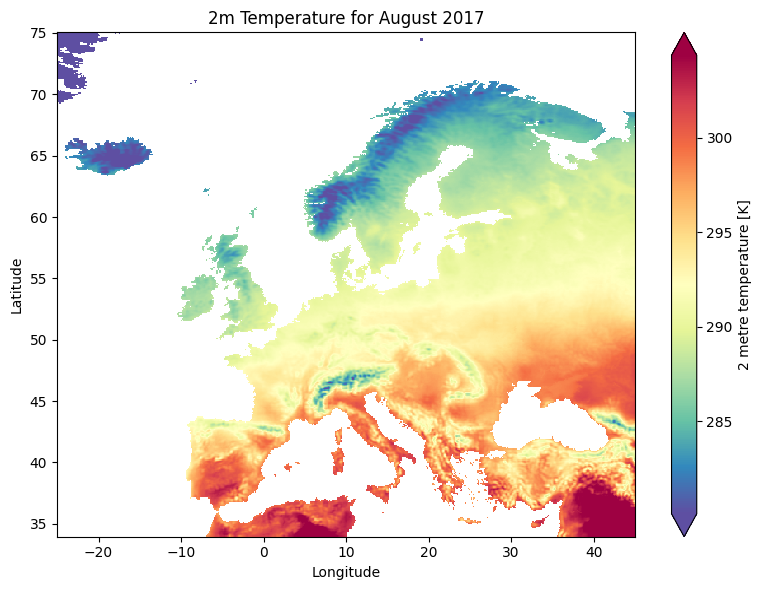

In [19]:

# Extract the 2m temperature for August 2017
august_2017_temp = ds['t2m'].sel(valid_time='2017-08-01')

# Plot temperature for August 2017
plt.figure(figsize=(8, 6))
august_2017_temp.plot(cmap='Spectral_r', robust=True)
plt.title("2m Temperature for August 2017")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


In [21]:
# Load the geodataframe
shapefile_path = r"D:\Analytics\project\code_reeves\gadm41_DEU_shp\gadm41_DEU_2.shp"
gdf = gpd.read_file(shapefile_path)
gdf.head()

,GID_0,COUNTRY,NAME_1,NAME_2,geometry
0,DEU,Germany,Baden-Württemberg,Alb-Donau-Kreis,"POLYGON ((9.67322 48.17136, 9.6741 48.16991, 9..."
1,DEU,Germany,Baden-Württemberg,Baden-Baden,"MULTIPOLYGON (((8.11805 48.73807, 8.11372 48.7..."
2,DEU,Germany,Baden-Württemberg,Biberach,"POLYGON ((9.75139 47.97439, 9.75106 47.97507, ..."
3,DEU,Germany,Baden-Württemberg,Böblingen,"POLYGON ((8.8512 48.53292, 8.85111 48.53247, 8..."
4,DEU,Germany,Baden-Württemberg,Bodensee,"POLYGON ((9.04492 47.81646, 9.04539 47.81644, ..."


So now we have our geodataframe for Germany at the administrative level 2. We can further process over dataset over the target area.

<Axes: >

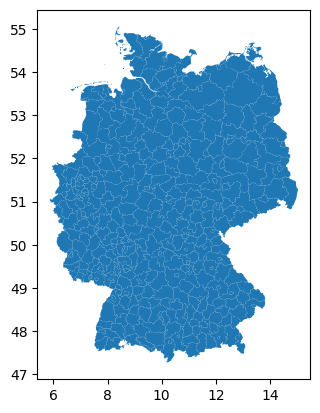

In [22]:
gdf.plot()

In [23]:

# Load dataset
ds_rio = ds

# Assign CRS if missing
if ds_rio.rio.crs is None:
    ds_rio.rio.write_crs("EPSG:4326", inplace=True)

# Load and reproject shapefile
gdf = gpd.read_file("D:/Analytics/project/code_reeves/gadm41_DEU_shp/gadm41_DEU_4.shp")
if gdf.crs != ds_rio.rio.crs:
    gdf = gdf.to_crs(ds_rio.rio.crs)

# Clip the 't2m' DataArray
t2m_clipped = ds_rio['t2m'].rio.clip(gdf.geometry, all_touched=True, drop=True)
ds_clipped = t2m_clipped.to_dataset(name="t2m")



In [24]:
ds_clipped

<xarray.Dataset> Size: 9MB
Dimensions:      (valid_time: 300, latitude: 79, longitude: 92)
Coordinates:
    number       int64 8B ...
  * valid_time   (valid_time) datetime64[ns] 2kB 2000-01-01 ... 2024-12-01
  * latitude     (latitude) float64 632B 55.1 55.0 54.9 54.8 ... 47.5 47.4 47.3
  * longitude    (longitude) float64 736B 5.9 6.0 6.1 6.2 ... 14.8 14.9 15.0
    expver       (valid_time) <U4 5kB ...
    spatial_ref  int32 4B 0
Data variables:
    t2m          (valid_time, latitude, longitude) float32 9MB nan nan ... nan

In [25]:
# Extract all districts within Bayern
gdf_bayern = gdf[gdf["NAME_1"] == "Bayern"]

# Check the result
print(gdf_bayern[["NAME_1", "NAME_2"]].head())


      NAME_1             NAME_2
1104  Bayern  Aichach-Friedberg
1105  Bayern  Aichach-Friedberg
1106  Bayern  Aichach-Friedberg
1107  Bayern  Aichach-Friedberg
1108  Bayern  Aichach-Friedberg


<Axes: >

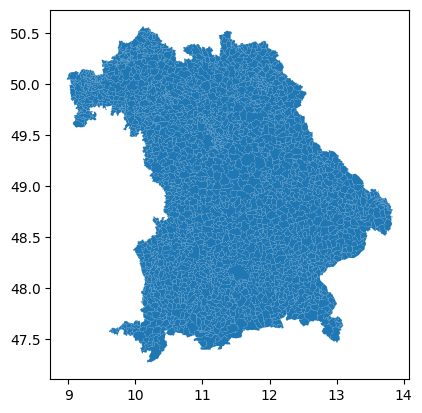

In [26]:
gdf_bayern.plot()

In [27]:

# Your filtered Bayern GeoDataFrame
gdf_bayern = gdf[gdf["NAME_1"] == "Bayern"]

# Ensure the CRS matches your raster dataset CRS (EPSG:4326 assumed)
if gdf_bayern.crs != ds_clipped.rio.crs:
    gdf_bayern = gdf_bayern.to_crs(ds_clipped.rio.crs)

# We want unique polygons by NAME_2, so dissolve all parts for each district into one geometry
gdf_bayern_unique = gdf_bayern.dissolve(by='NAME_2').reset_index()

# Convert temperature from K to °C (assuming ds_clipped.t2m in Kelvin)
# Add a new variable to your dataset for convenience
ds_clipped['t2m_celsius'] = ds_clipped['t2m'] - 273.15

# Create a dictionary or DataFrame to store results
results = []

for idx, row in gdf_bayern_unique.iterrows():
    name2 = row['NAME_2']
    geometry = row['geometry']

    # Clip raster data to this polygon (per timestep)
    clipped = ds_clipped['t2m_celsius'].rio.clip([geometry], all_touched=True, drop=False)

    # Calculate mean temperature per time (ignoring NaNs)
    mean_temp_time_series = clipped.mean(dim=['latitude', 'longitude'], skipna=True).to_pandas()

    # Convert to DataFrame for each district
    df_temp = pd.DataFrame({
        'valid_time': mean_temp_time_series.index,
        'mean_t2m_celsius': mean_temp_time_series.values,
        'NAME_2': name2
    })

    results.append(df_temp)

# Concatenate all district time series
df_all = pd.concat(results)

# Optional: convert back to GeoDataFrame with geometries
gdf_results = gdf_bayern_unique.merge(df_all.groupby('NAME_2').mean().reset_index(), on='NAME_2')

# Print sample result for one district
print(df_all[df_all['NAME_2'] == 'Aichach-Friedberg'].head())


  valid_time  mean_t2m_celsius             NAME_2
0 2000-01-01         -0.708431  Aichach-Friedberg
1 2000-02-01          3.562897  Aichach-Friedberg
2 2000-03-01          5.063517  Aichach-Friedberg
3 2000-04-01         10.138580  Aichach-Friedberg
4 2000-05-01         14.757291  Aichach-Friedberg


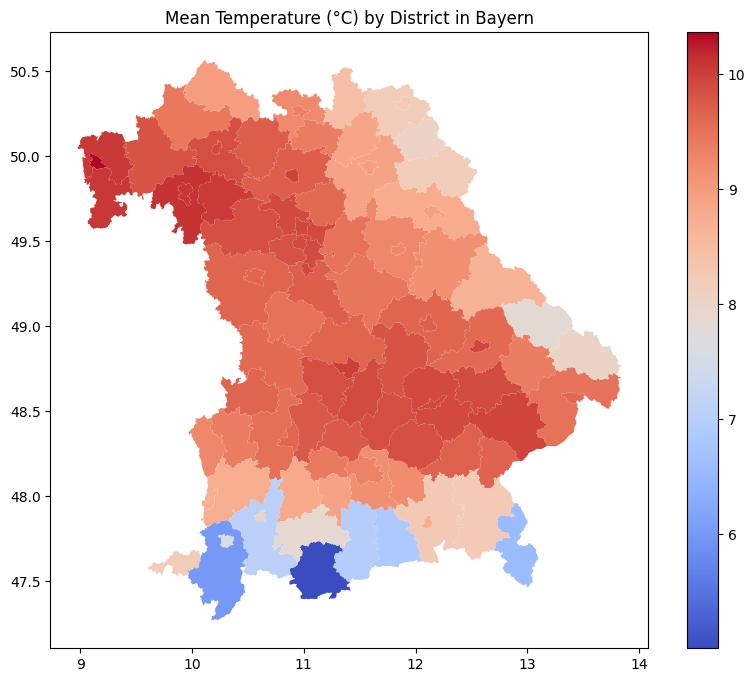

In [28]:
# Plot the mean temperature over the years
gdf_results.plot(column='mean_t2m_celsius', cmap='coolwarm', legend=True, figsize=(10,8))
plt.title('Mean Temperature (°C) by District in Bayern')
plt.show()


In [29]:

# 1. Ensure valid_time is datetime
df_all['valid_time'] = pd.to_datetime(df_all['valid_time'])

# 2. Extract month from valid_time
df_all['month'] = df_all['valid_time'].dt.month

# 3. Calculate monthly baseline mean temperature per district (2000–2020)
baseline = (
    df_all[(df_all['valid_time'] >= '2000-01-01') & (df_all['valid_time'] <= '2020-12-31')]
    .groupby(['NAME_2', 'month'])['mean_t2m_celsius']
    .mean()
    .rename('baseline_mean')
    .reset_index()
)

# 4. Merge monthly baseline back into full dataset
df_all = df_all.merge(baseline, on=['NAME_2', 'month'], how='left')

# 5. Compute monthly anomalies relative to baseline
df_all['t2m_anomaly'] = df_all['mean_t2m_celsius'] - df_all['baseline_mean']

# 6. Clean geometry GeoDataFrame to avoid column conflicts
cols_to_drop = ['baseline_mean', 'mean_t2m_celsius', 't2m_anomaly', 'valid_time', 'month']
gdf_clean = gdf_bayern_unique.drop(columns=[c for c in cols_to_drop if c in gdf_bayern_unique.columns])

# 7. Merge with geometries to retain as GeoDataFrame
anomalies = gdf_clean.merge(df_all, on='NAME_2', how='left')

# Now anomalies is a GeoDataFrame with valid_time, t2m_anomaly, etc.

# Example: check anomalies for 'Aichach-Friedberg'
print(anomalies[anomalies['NAME_2'] == 'Aichach-Friedberg'][['valid_time', 'month', 't2m_anomaly']].head())


  valid_time  month  t2m_anomaly
0 2000-01-01      1    -0.935085
1 2000-02-01      2     2.526158
2 2000-03-01      3     0.220520
3 2000-04-01      4     0.500425
4 2000-05-01      5     1.109228


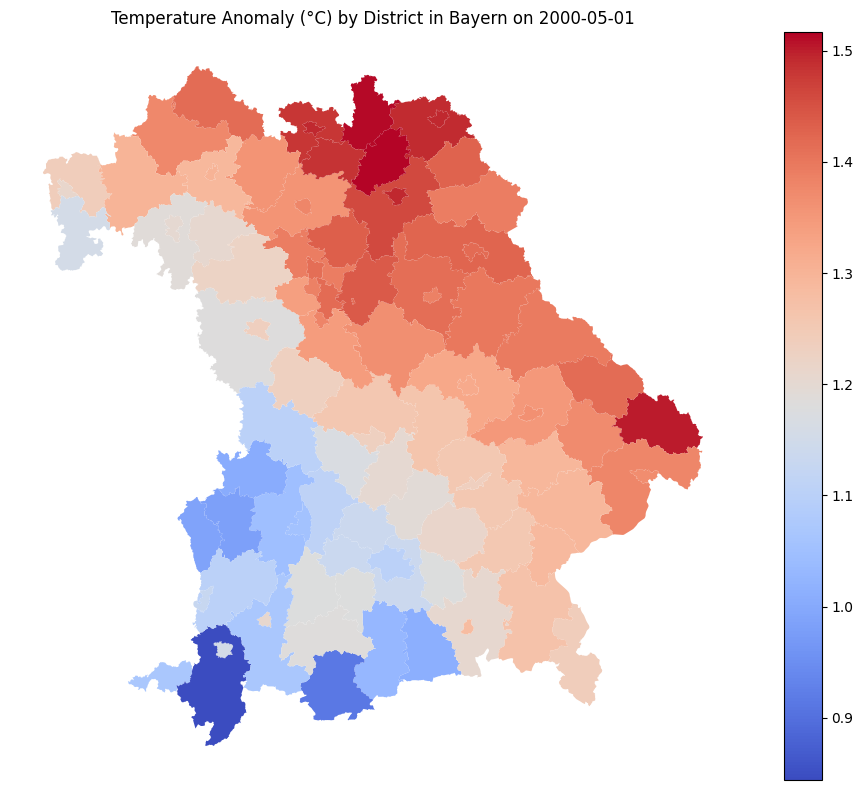

In [30]:
import matplotlib.pyplot as plt

# Select the date you want to visualize
date_to_plot = '2000-05-01'

# Filter the GeoDataFrame for that date
anomaly_on_date = anomalies[anomalies['valid_time'] == date_to_plot]

# Plot the anomalies
anomaly_on_date.plot(
    column='t2m_anomaly',
    cmap='coolwarm',        # same colormap as your preferred design
    legend=True,
    figsize=(10, 8)
)

# Title and layout
plt.title(f'Temperature Anomaly (°C) by District in Bayern on {date_to_plot}')
plt.axis('off')
plt.tight_layout()
plt.show()


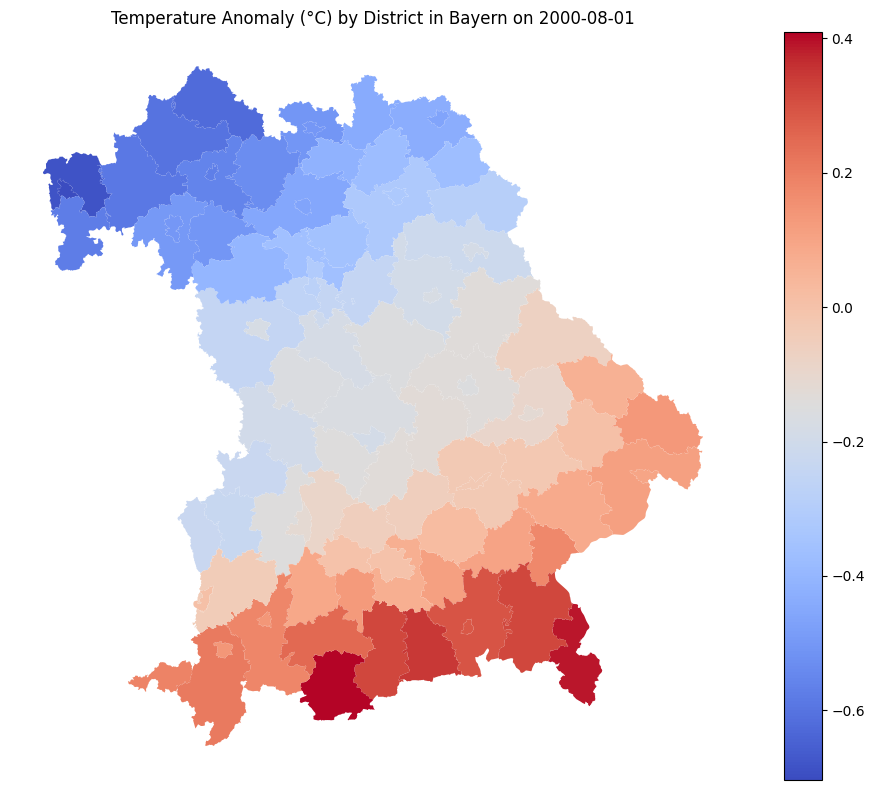

In [31]:

# Select the date you want to visualize
date_to_plot = '2000-08-01'

# Filter the GeoDataFrame for that date
anomaly_on_date = anomalies[anomalies['valid_time'] == date_to_plot]

# Plot the anomalies
anomaly_on_date.plot(
    column='t2m_anomaly',
    cmap='coolwarm',        # same colormap as your preferred design
    legend=True,
    figsize=(10, 8)
)

# Title and layout
plt.title(f'Temperature Anomaly (°C) by District in Bayern on {date_to_plot}')
plt.axis('off')
plt.tight_layout()
plt.show()


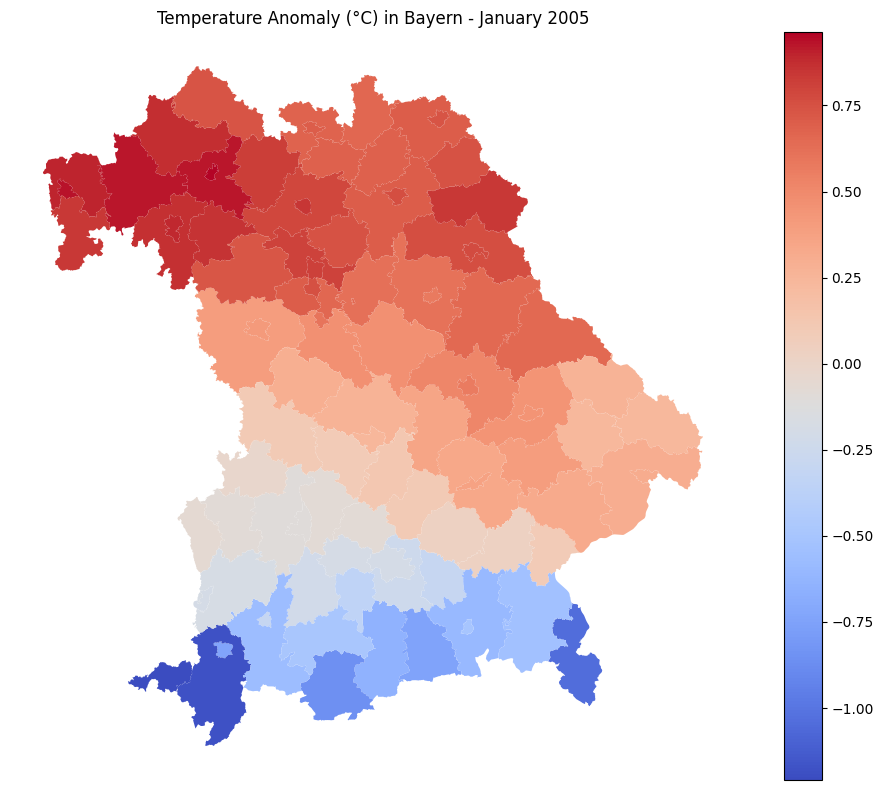

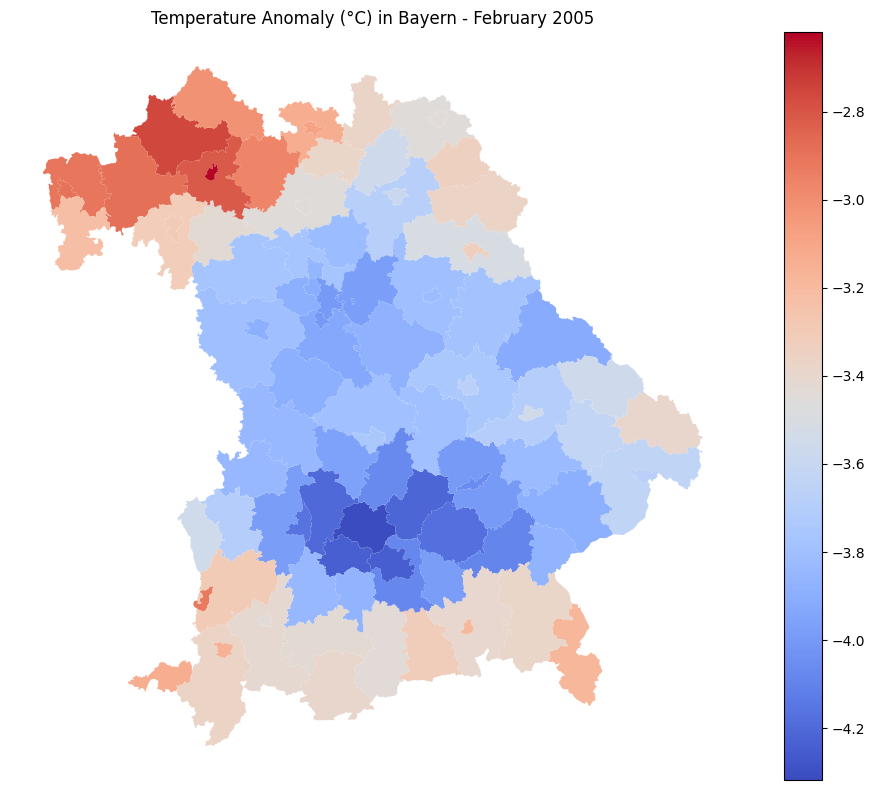

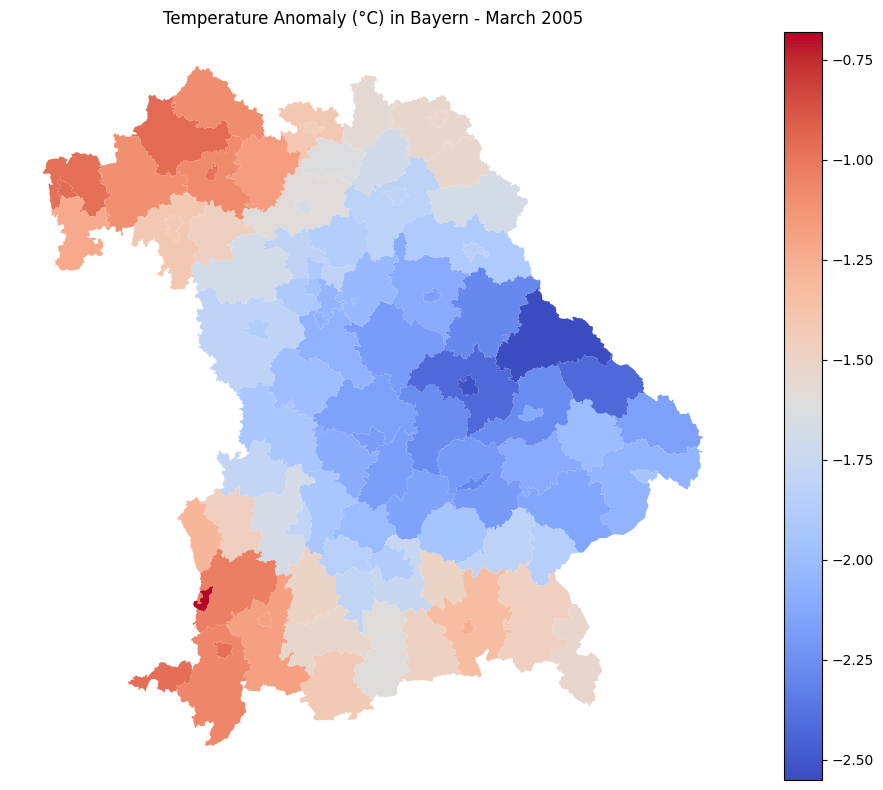

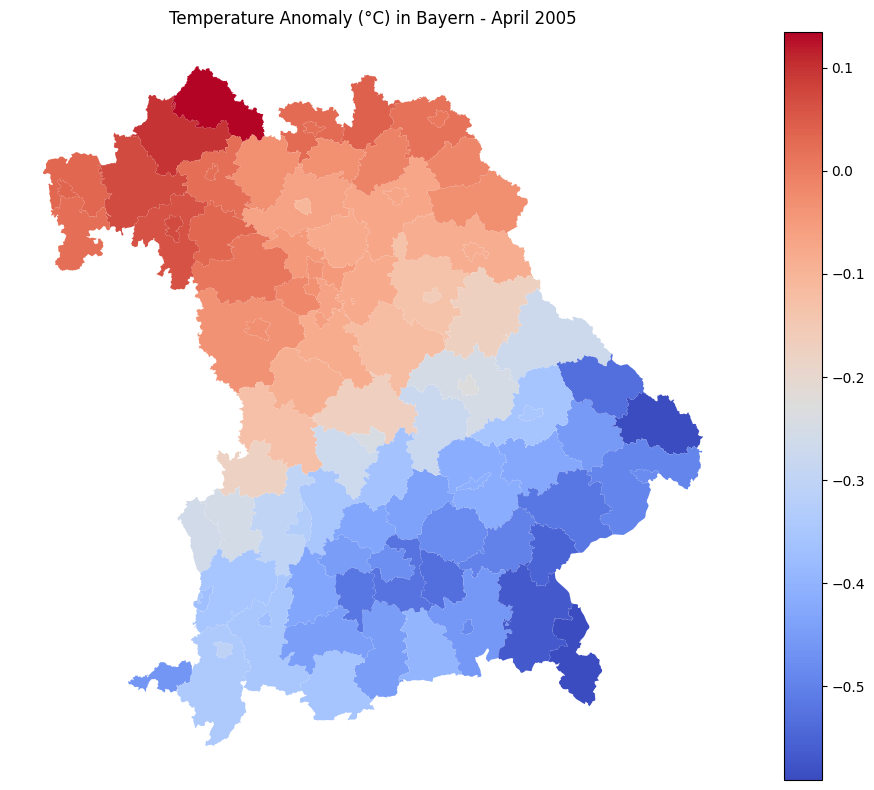

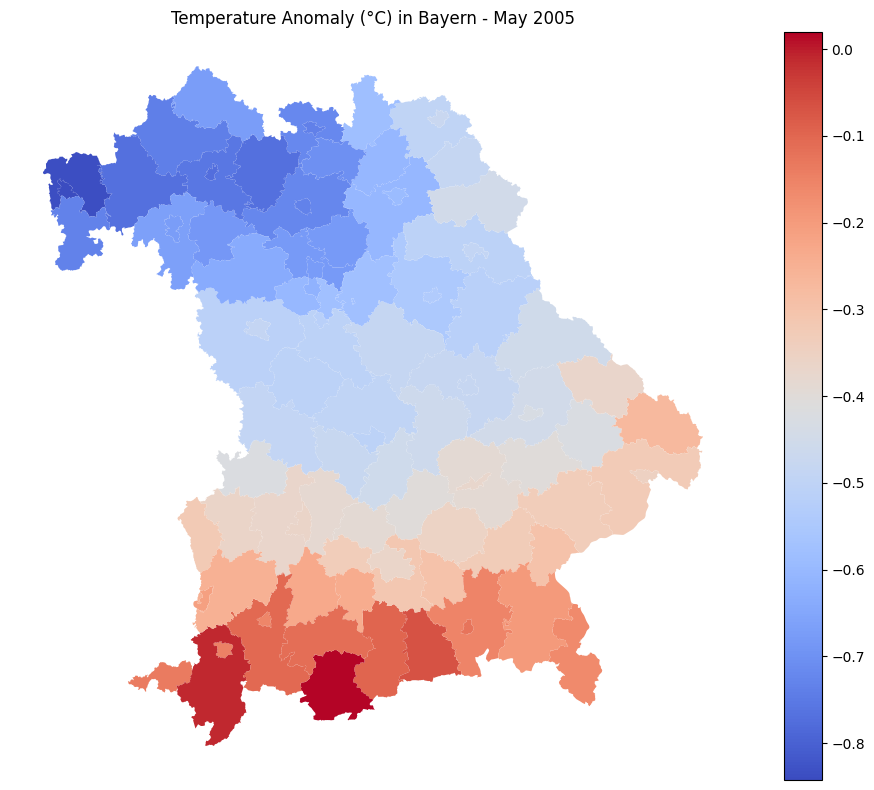

...

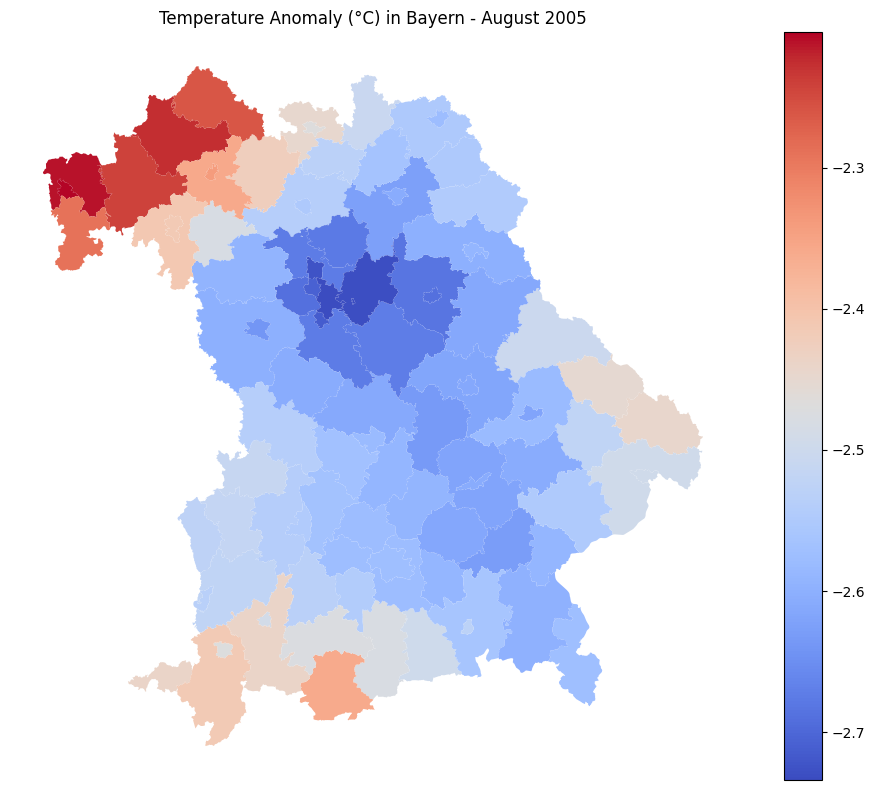

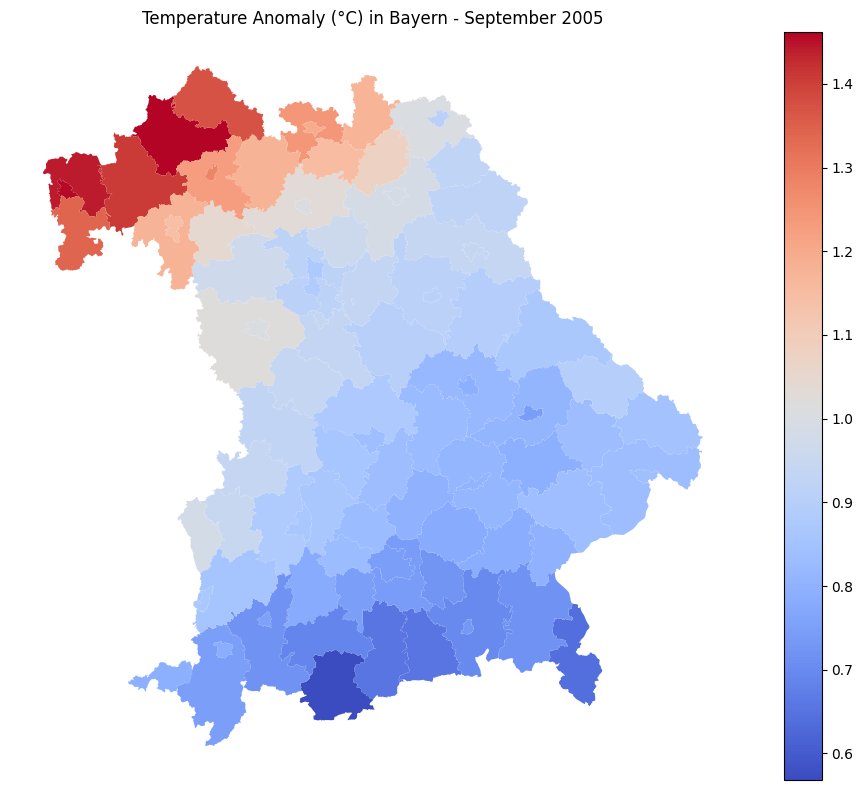

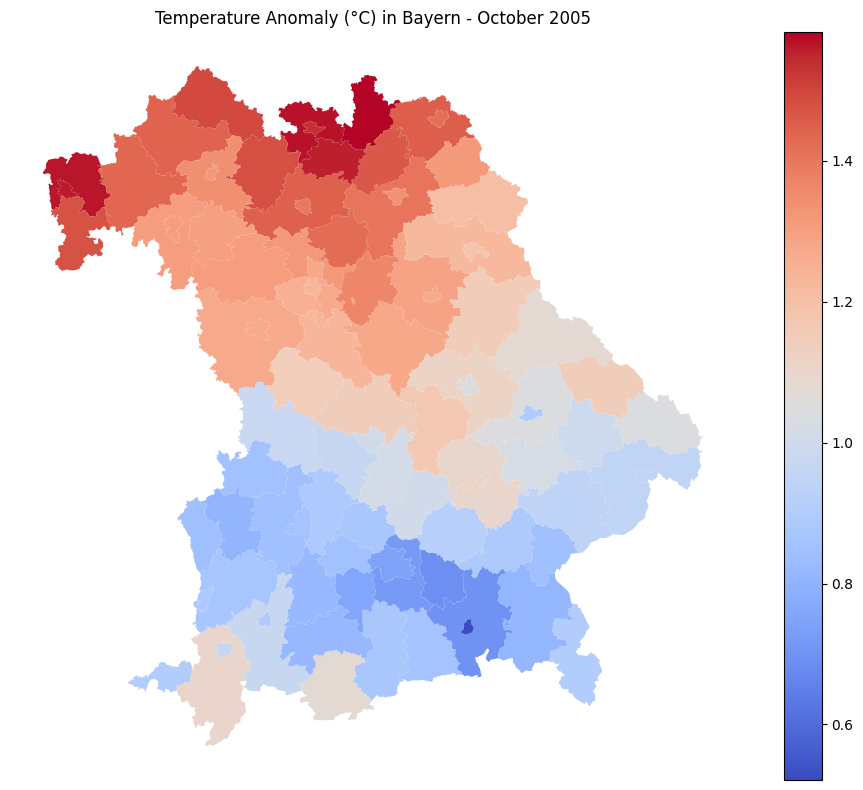

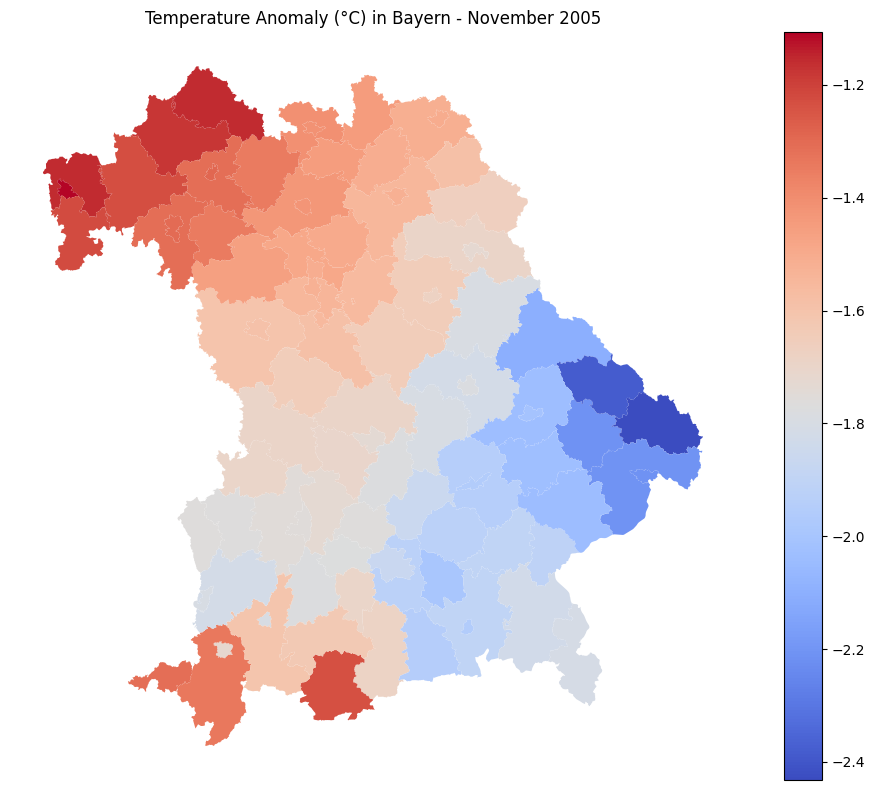

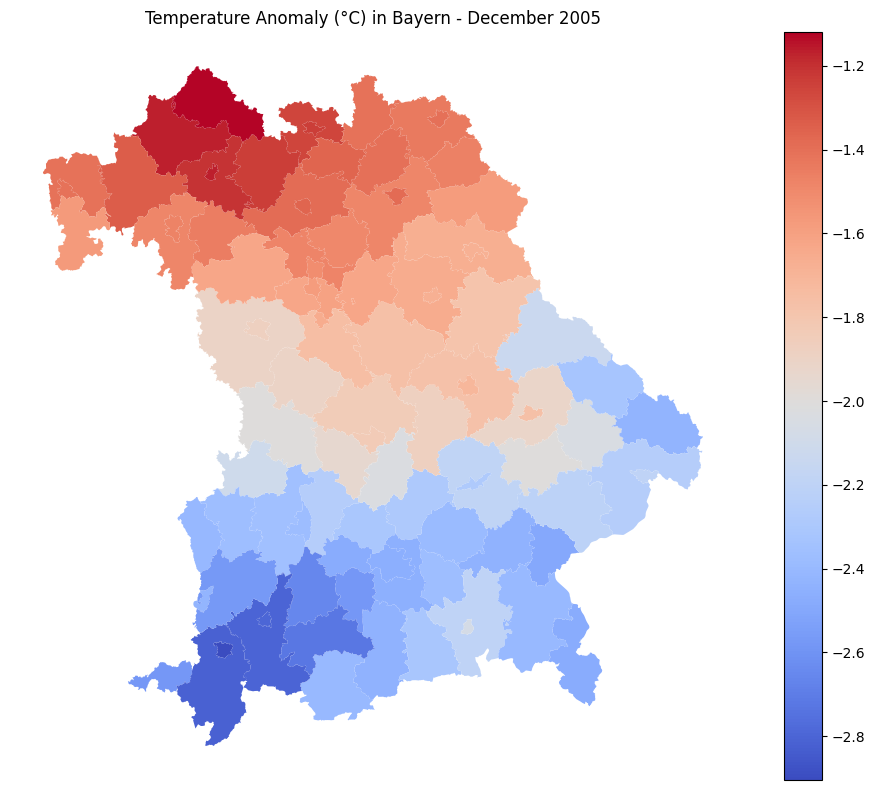

In [32]:

# Choose the year to plot
year_to_plot = 2005

# Filter the anomalies GeoDataFrame for that year
anomalies_year = anomalies[anomalies['valid_time'].dt.year == year_to_plot]

# Loop through all 12 months and plot individually
for month in range(1, 13):
    # Filter for this specific month
    date_to_plot = pd.Timestamp(year_to_plot, month, 1)
    anomaly_month = anomalies_year[anomalies_year['valid_time'] == date_to_plot]

    if anomaly_month.empty:
        continue  # Skip if no data for this month

    # Plot using default min/max scaling per month
    ax = anomaly_month.plot(
        column='t2m_anomaly',
        cmap='coolwarm',
        legend=True,
        figsize=(10, 8)
    )

    # Title and layout
    plt.title(f'Temperature Anomaly (°C) in Bayern - {date_to_plot.strftime("%B %Y")}')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [33]:
# 1. Ensure valid_time is datetime
df_all['valid_time'] = pd.to_datetime(df_all['valid_time'])

# 2. Extract year and month
df_all['year'] = df_all['valid_time'].dt.year
df_all['month'] = df_all['valid_time'].dt.month

# 3. Define seasons
seasons = {
    'Winter': [12, 1, 2],
    'Spring': [3, 4, 5],
    'Summer': [6, 7, 8],
    'Autumn': [9, 10, 11]
}

# 4. Assign season and season year
def get_season(month):
    for season, months in seasons.items():
        if month in months:
            return season
    return np.nan

df_all['season'] = df_all['month'].apply(get_season)
df_all['season_year'] = df_all['year']
df_all.loc[df_all['month'].isin([1, 2]), 'season_year'] -= 1  # Jan–Feb belong to previous year

# 5. Filter out pre-2000 values due to Jan/Feb shift
df_all = df_all[df_all['season_year'] >= 2000]

# 6. Seasonal means
seasonal_means = (
    df_all.groupby(['NAME_2', 'season_year', 'season'])['mean_t2m_celsius']
    .mean()
    .reset_index()
)

# 7. Annual means (direct, not from seasonal)
annual_means = (
    df_all.groupby(['NAME_2', 'year'])['mean_t2m_celsius']
    .mean()
    .reset_index()
    .rename(columns={'year': 'season_year'})  # To align column names
)
annual_means['season'] = 'Annual'  # Add artificial season label

# 8. Combine seasonal and annual
combined_means = pd.concat([seasonal_means, annual_means], ignore_index=True)

# 9. Baseline (2000–2020) for each NAME_2 and season (including Annual)
baseline = (
    combined_means[combined_means['season_year'].between(2000, 2020)]
    .groupby(['NAME_2', 'season'])['mean_t2m_celsius']
    .mean()
    .rename('baseline_mean')
    .reset_index()
)

# 10. Merge baseline and compute anomaly
combined_anomalies = combined_means.merge(baseline, on=['NAME_2', 'season'], how='left')
combined_anomalies['t2m_anomaly'] = combined_anomalies['mean_t2m_celsius'] - combined_anomalies['baseline_mean']

# 11. Merge with geometry
seasonal_gdf = gdf_bayern_unique.merge(combined_anomalies, on='NAME_2', how='left')


In [34]:
seasonal_gdf.head()

,NAME_2,geometry,GID_4,GID_0,COUNTRY,GID_1,NAME_1,GID_2,GID_3,NAME_3,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,season_year,season,mean_t2m_celsius,baseline_mean,t2m_anomaly
0,Aichach-Friedberg,"POLYGON ((11.04775 48.22, 11.04807 48.21915, 1...",DEU.2.1.1.1_1,DEU,Germany,DEU.2_1,Bayern,DEU.2.1_1,DEU.2.1.1_1,Affing,Affing,NA,Gemeinde,Town,097710112112,2000,Autumn,10.051759,9.755312,0.296447
1,Aichach-Friedberg,"POLYGON ((11.04775 48.22, 11.04807 48.21915, 1...",DEU.2.1.1.1_1,DEU,Germany,DEU.2_1,Bayern,DEU.2.1_1,DEU.2.1.1_1,Affing,Affing,NA,Gemeinde,Town,097710112112,2000,Spring,9.986463,9.376405,0.610058
2,Aichach-Friedberg,"POLYGON ((11.04775 48.22, 11.04807 48.21915, 1...",DEU.2.1.1.1_1,DEU,Germany,DEU.2_1,Bayern,DEU.2.1_1,DEU.2.1.1_1,Affing,Affing,NA,Gemeinde,Town,097710112112,2000,Summer,17.348984,18.440390,-1.091406
3,Aichach-Friedberg,"POLYGON ((11.04775 48.22, 11.04807 48.21915, 1...",DEU.2.1.1.1_1,DEU,Germany,DEU.2_1,Bayern,DEU.2.1_1,DEU.2.1.1_1,Affing,Affing,NA,Gemeinde,Town,097710112112,2000,Winter,1.829198,0.846434,0.982763
4,Aichach-Friedberg,"POLYGON ((11.04775 48.22, 11.04807 48.21915, 1...",DEU.2.1.1.1_1,DEU,Germany,DEU.2_1,Bayern,DEU.2.1_1,DEU.2.1.1_1,Affing,Affing,NA,Gemeinde,Town,097710112112,2001,Autumn,9.015744,9.755312,-0.739568


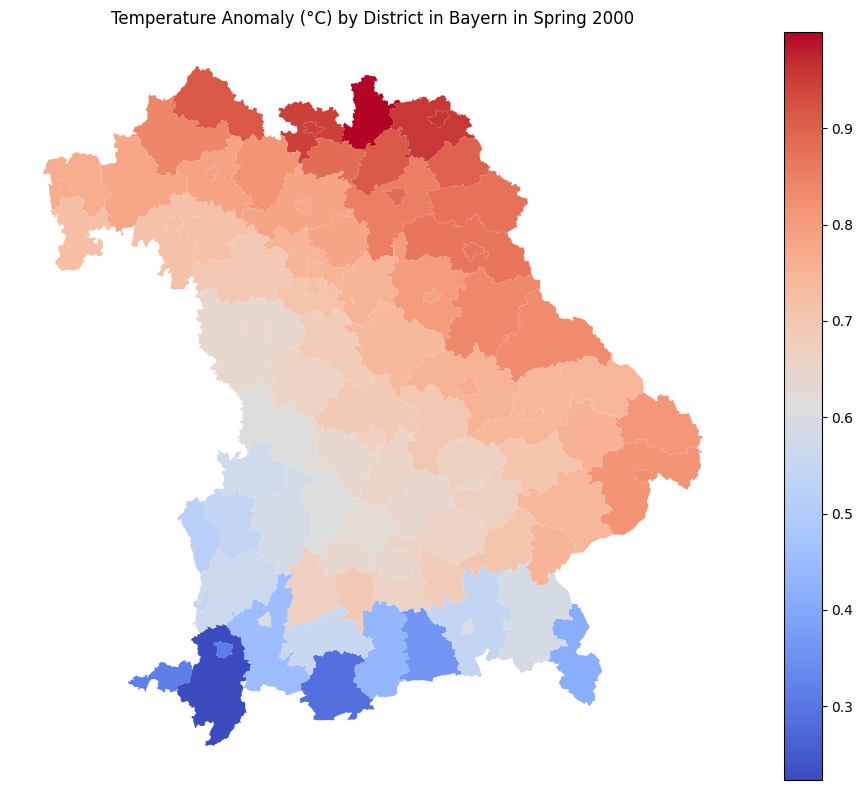

In [35]:

# Example: Plot Spring 2000 seasonal anomaly

season_to_plot = 'Spring'
year_to_plot = 2000

# Filter for that season and year
anomaly_on_season = seasonal_gdf[
    (seasonal_gdf['season'] == season_to_plot) & 
    (seasonal_gdf['season_year'] == year_to_plot)
]

# Plot the anomalies
anomaly_on_season.plot(
    column='t2m_anomaly',
    cmap='coolwarm',
    legend=True,
    figsize=(10, 8)
)

plt.title(f'Temperature Anomaly (°C) by District in Bayern in {season_to_plot} {year_to_plot}')
plt.axis('off')
plt.tight_layout()
plt.show()


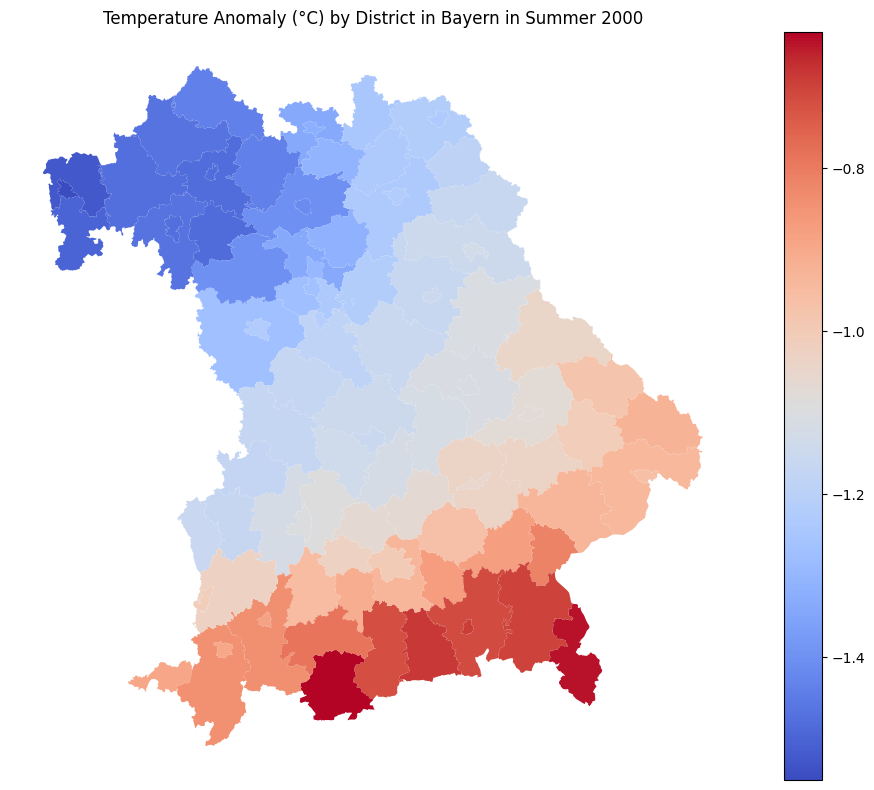

In [36]:

# Example: Plot Spring 2000 seasonal anomaly

season_to_plot = 'Summer'
year_to_plot = 2000

# Filter for that season and year
anomaly_on_season = seasonal_gdf[
    (seasonal_gdf['season'] == season_to_plot) & 
    (seasonal_gdf['season_year'] == year_to_plot)
]

# Plot the anomalies
anomaly_on_season.plot(
    column='t2m_anomaly',
    cmap='coolwarm',
    legend=True,
    figsize=(10, 8)
)

plt.title(f'Temperature Anomaly (°C) by District in Bayern in {season_to_plot} {year_to_plot}')
plt.axis('off')
plt.tight_layout()
plt.show()


Let us now assess in details temperature anomalies at the level of administrative entities over the entire time series 
so as to clearly establish warmer and cold years and most affected parts in Bavaria under climate change!
To do this, we shall aggregate monthly anomalies to seasonal over subnational entities!

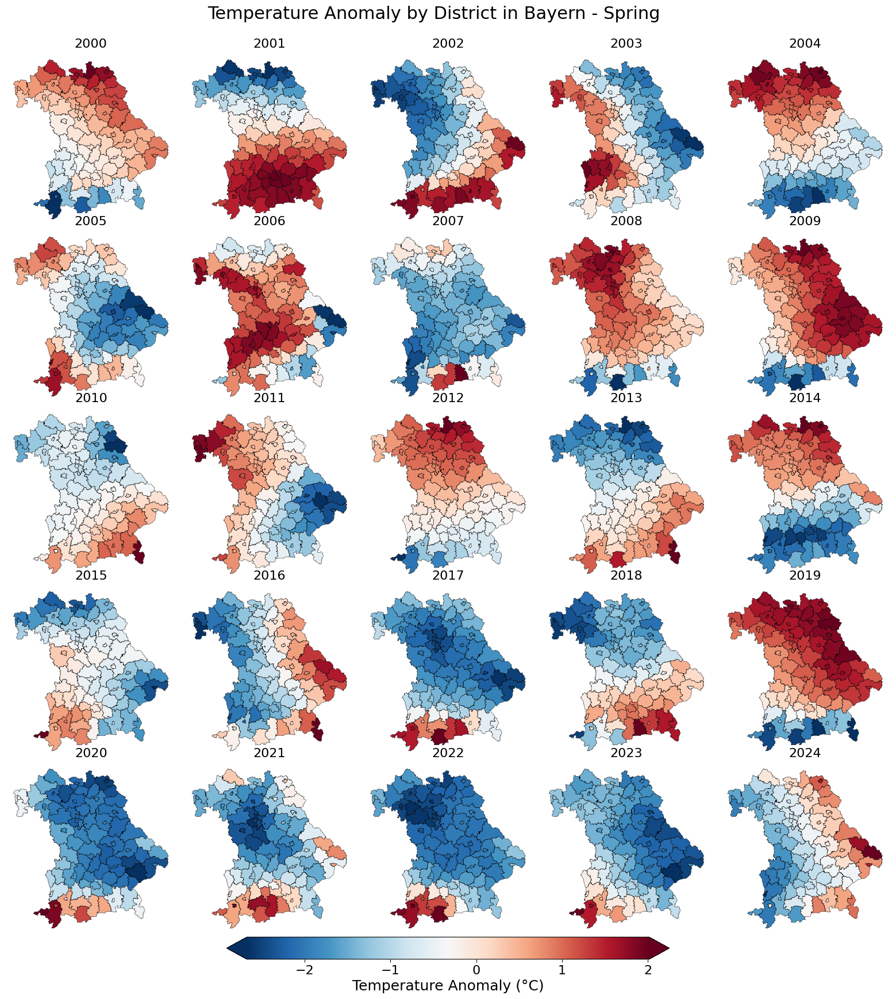

In [37]:

# Parameters to customize size and fonts
n_cols = 5
subplot_size = 4
title_fontsize = 16
suptitle_fontsize = 22
colorbar_label_fontsize = 18
colorbar_tick_fontsize = 16

season_to_plot = 'Spring'
years_to_plot = list(range(2000, 2025))
n_rows = int(np.ceil(len(years_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_size * n_cols, subplot_size * n_rows), constrained_layout=False)
axes = axes.flatten()

for i, year in enumerate(years_to_plot):
    ax = axes[i]
    anomaly_on_season = seasonal_gdf[
        (seasonal_gdf['season'] == season_to_plot) & 
        (seasonal_gdf['season_year'] == year)
    ]
    
    anomaly_on_season.plot(
        column='t2m_anomaly',
        cmap='RdBu_r',
        legend=False,
        edgecolor='black',
        linewidth=0.3,
        ax=ax
    )
    
    ax.set_title(f'{year}', fontsize=title_fontsize, pad=5)  # Adjust pad here
    ax.axis('off')

# Remove any unused axes
for j in range(i+1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Consistent color scale limits
vmin = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].min()
vmax = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].max()

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
sm.set_array([])

# Add horizontal colorbar below all plots
cbar = fig.colorbar(
    sm, 
    ax=axes.tolist(), 
    orientation='horizontal', 
    fraction=0.025,  # thinner colorbar
    pad=0.01,       # more space below plots
    extend='both'
)
cbar.set_label('Temperature Anomaly (°C)', fontsize=colorbar_label_fontsize)
cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

# Move suptitle closer to subplots
plt.suptitle(f'Temperature Anomaly by District in Bayern - {season_to_plot}', fontsize=suptitle_fontsize, y=0.94)

# Adjust subplot spacing: tighten gaps, move bottom margin up to make room for colorbar
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.13, top=0.9)

plt.show()


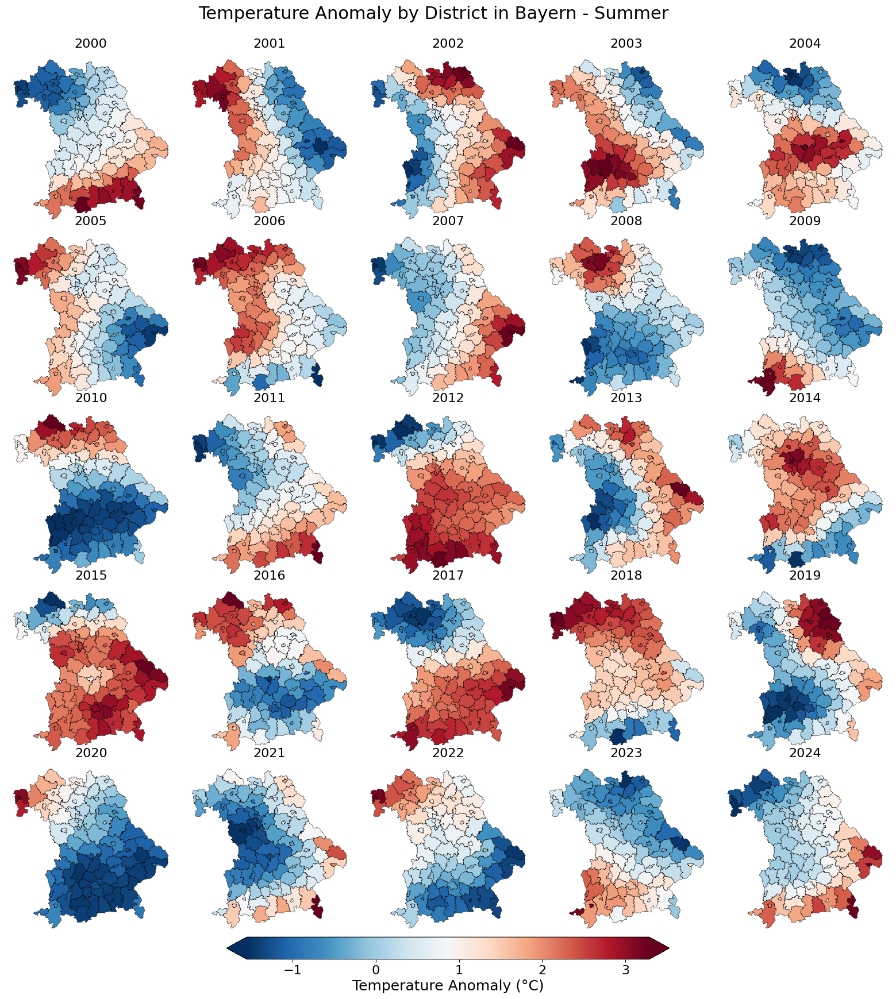

In [38]:

# Parameters to customize size and fonts
n_cols = 5
subplot_size = 4
title_fontsize = 16
suptitle_fontsize = 22
colorbar_label_fontsize = 18
colorbar_tick_fontsize = 16

season_to_plot = 'Summer'
years_to_plot = list(range(2000, 2025))
n_rows = int(np.ceil(len(years_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_size * n_cols, subplot_size * n_rows), constrained_layout=False)
axes = axes.flatten()

for i, year in enumerate(years_to_plot):
    ax = axes[i]
    anomaly_on_season = seasonal_gdf[
        (seasonal_gdf['season'] == season_to_plot) & 
        (seasonal_gdf['season_year'] == year)
    ]
    
    anomaly_on_season.plot(
        column='t2m_anomaly',
        cmap='RdBu_r',
        legend=False,
        edgecolor='black',
        linewidth=0.3,
        ax=ax
    )
    
    ax.set_title(f'{year}', fontsize=title_fontsize, pad=5)  # Adjust pad here
    ax.axis('off')

# Remove any unused axes
for j in range(i+1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Consistent color scale limits
vmin = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].min()
vmax = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].max()

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
sm.set_array([])

# Add horizontal colorbar below all plots
cbar = fig.colorbar(
    sm, 
    ax=axes.tolist(), 
    orientation='horizontal', 
    fraction=0.025,  # thinner colorbar
    pad=0.01,       # more space below plots
    extend='both'
)
cbar.set_label('Temperature Anomaly (°C)', fontsize=colorbar_label_fontsize)
cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

# Move suptitle closer to subplots
plt.suptitle(f'Temperature Anomaly by District in Bayern - {season_to_plot}', fontsize=suptitle_fontsize, y=0.94)

# Adjust subplot spacing: tighten gaps, move bottom margin up to make room for colorbar
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.13, top=0.9)

plt.show()


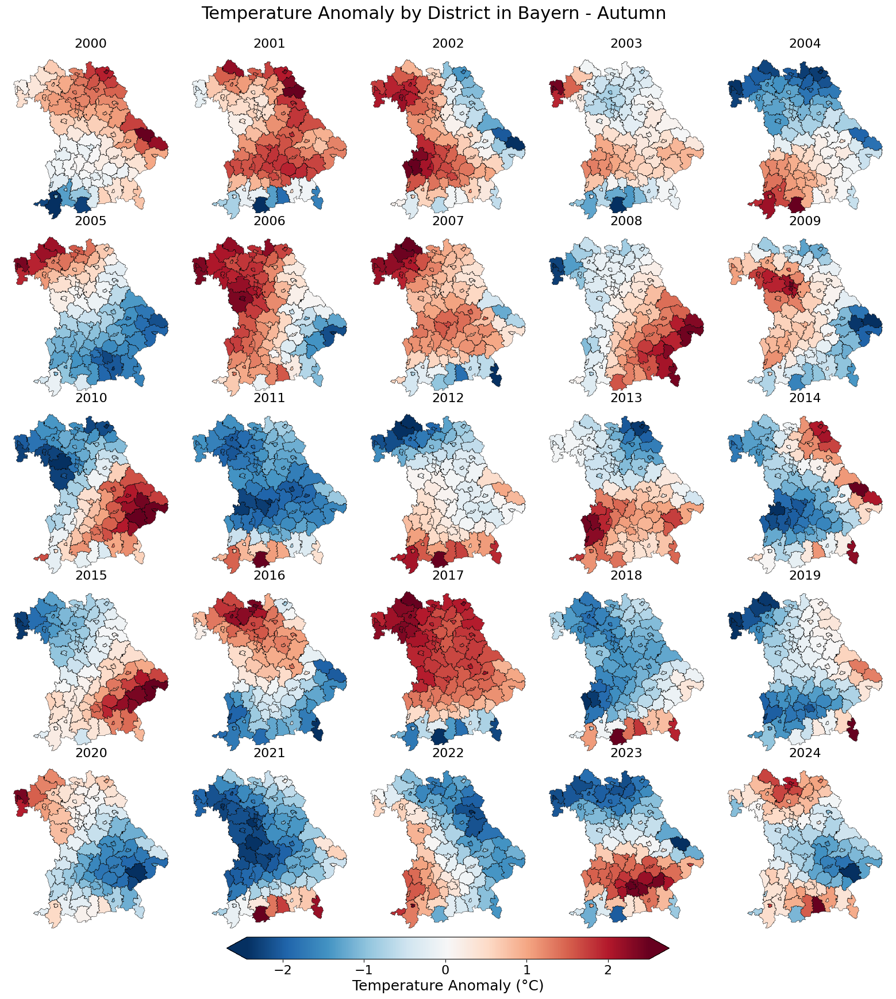

In [39]:
# Parameters to customize size and fonts
n_cols = 5
subplot_size = 4
title_fontsize = 16
suptitle_fontsize = 22
colorbar_label_fontsize = 18
colorbar_tick_fontsize = 16

season_to_plot = 'Autumn'
years_to_plot = list(range(2000, 2025))
n_rows = int(np.ceil(len(years_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_size * n_cols, subplot_size * n_rows), constrained_layout=False)
axes = axes.flatten()

for i, year in enumerate(years_to_plot):
    ax = axes[i]
    anomaly_on_season = seasonal_gdf[
        (seasonal_gdf['season'] == season_to_plot) & 
        (seasonal_gdf['season_year'] == year)
    ]
    
    anomaly_on_season.plot(
        column='t2m_anomaly',
        cmap='RdBu_r',
        legend=False,
        edgecolor='black',
        linewidth=0.3,
        ax=ax
    )
    
    ax.set_title(f'{year}', fontsize=title_fontsize, pad=5)  # Adjust pad here
    ax.axis('off')

# Remove any unused axes
for j in range(i+1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Consistent color scale limits
vmin = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].min()
vmax = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].max()

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
sm.set_array([])

# Add horizontal colorbar below all plots
cbar = fig.colorbar(
    sm, 
    ax=axes.tolist(), 
    orientation='horizontal', 
    fraction=0.025,  # thinner colorbar
    pad=0.01,       # more space below plots
    extend='both'
)
cbar.set_label('Temperature Anomaly (°C)', fontsize=colorbar_label_fontsize)
cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

# Move suptitle closer to subplots
plt.suptitle(f'Temperature Anomaly by District in Bayern - {season_to_plot}', fontsize=suptitle_fontsize, y=0.94)

# Adjust subplot spacing: tighten gaps, move bottom margin up to make room for colorbar
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.13, top=0.9)

plt.show()


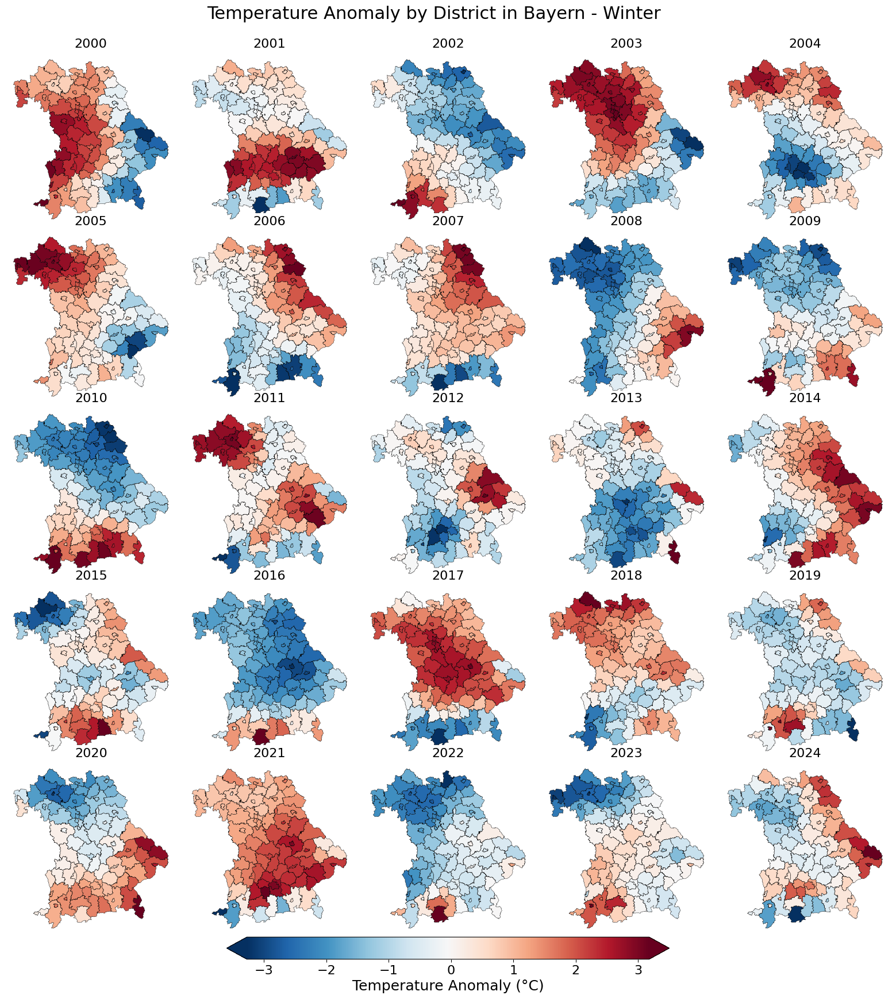

In [40]:
# Parameters to customize size and fonts
n_cols = 5
subplot_size = 4
title_fontsize = 16
suptitle_fontsize = 22
colorbar_label_fontsize = 18
colorbar_tick_fontsize = 16

season_to_plot = 'Winter'
years_to_plot = list(range(2000, 2025))
n_rows = int(np.ceil(len(years_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_size * n_cols, subplot_size * n_rows), constrained_layout=False)
axes = axes.flatten()

for i, year in enumerate(years_to_plot):
    ax = axes[i]
    anomaly_on_season = seasonal_gdf[
        (seasonal_gdf['season'] == season_to_plot) & 
        (seasonal_gdf['season_year'] == year)
    ]
    
    anomaly_on_season.plot(
        column='t2m_anomaly',
        cmap='RdBu_r',
        legend=False,
        edgecolor='black',
        linewidth=0.3,
        ax=ax
    )
    
    ax.set_title(f'{year}', fontsize=title_fontsize, pad=5)  # Adjust pad here
    ax.axis('off')

# Remove any unused axes
for j in range(i+1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Consistent color scale limits
vmin = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].min()
vmax = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].max()

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
sm.set_array([])

# Add horizontal colorbar below all plots
cbar = fig.colorbar(
    sm, 
    ax=axes.tolist(), 
    orientation='horizontal', 
    fraction=0.025,  # thinner colorbar
    pad=0.01,       # more space below plots
    extend='both'
)
cbar.set_label('Temperature Anomaly (°C)', fontsize=colorbar_label_fontsize)
cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

# Move suptitle closer to subplots
plt.suptitle(f'Temperature Anomaly by District in Bayern - {season_to_plot}', fontsize=suptitle_fontsize, y=0.94)

# Adjust subplot spacing: tighten gaps, move bottom margin up to make room for colorbar
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.13, top=0.9)

plt.show()


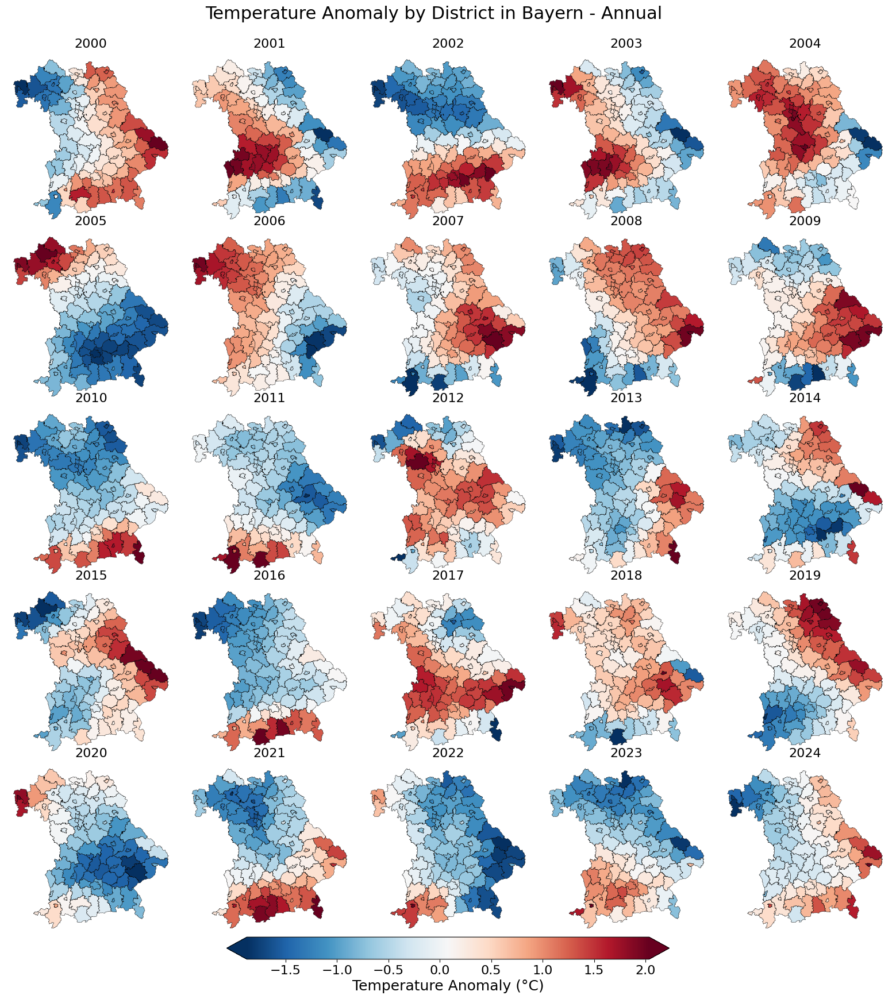

In [41]:
# Parameters to customize size and fonts
n_cols = 5
subplot_size = 4
title_fontsize = 16
suptitle_fontsize = 22
colorbar_label_fontsize = 18
colorbar_tick_fontsize = 16

season_to_plot = 'Annual'
years_to_plot = list(range(2000, 2025))
n_rows = int(np.ceil(len(years_to_plot) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_size * n_cols, subplot_size * n_rows), constrained_layout=False)
axes = axes.flatten()

for i, year in enumerate(years_to_plot):
    ax = axes[i]
    anomaly_on_season = seasonal_gdf[
        (seasonal_gdf['season'] == season_to_plot) & 
        (seasonal_gdf['season_year'] == year)
    ]
    
    anomaly_on_season.plot(
        column='t2m_anomaly',
        cmap='RdBu_r',
        legend=False,
        edgecolor='black',
        linewidth=0.3,
        ax=ax
    )
    
    ax.set_title(f'{year}', fontsize=title_fontsize, pad=5)  # Adjust pad here
    ax.axis('off')

# Remove any unused axes
for j in range(i+1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Consistent color scale limits
vmin = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].min()
vmax = seasonal_gdf.loc[seasonal_gdf['season'] == season_to_plot, 't2m_anomaly'].max()

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
sm.set_array([])

# Add horizontal colorbar below all plots
cbar = fig.colorbar(
    sm, 
    ax=axes.tolist(), 
    orientation='horizontal', 
    fraction=0.025,  # thinner colorbar
    pad=0.01,       # more space below plots
    extend='both'
)
cbar.set_label('Temperature Anomaly (°C)', fontsize=colorbar_label_fontsize)
cbar.ax.tick_params(labelsize=colorbar_tick_fontsize)

# Move suptitle closer to subplots
plt.suptitle(f'Temperature Anomaly by District in Bayern - {season_to_plot}', fontsize=suptitle_fontsize, y=0.94)

# Adjust subplot spacing: tighten gaps, move bottom margin up to make room for colorbar
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.13, top=0.9)

plt.show()


We can further visualize monthly anomalies in temperature for each sub-administarive areas

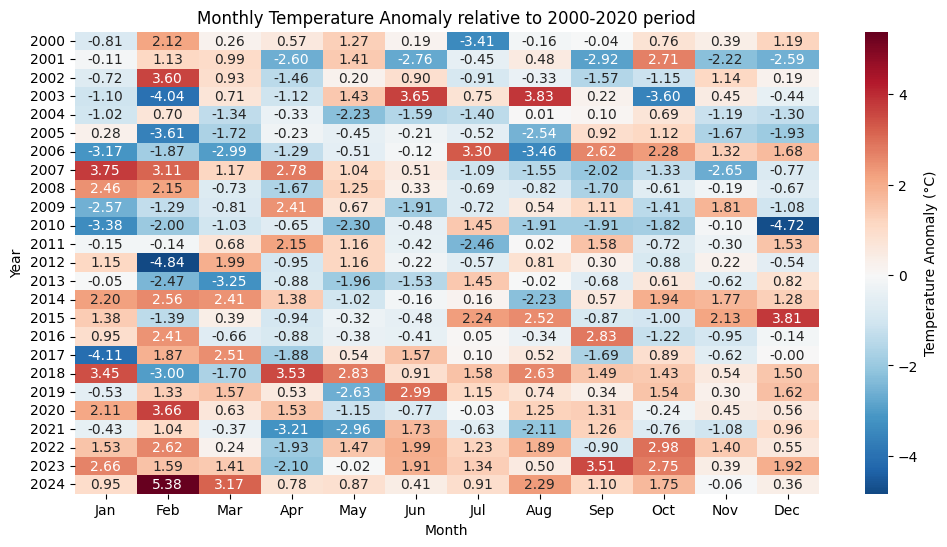

In [42]:
# Extract year and month from valid_time
anomalies['year'] = anomalies['valid_time'].dt.year
anomalies['month'] = anomalies['valid_time'].dt.month

# Aggregate anomaly by year and month (mean over all districts)
anomaly_heatmap = anomalies.groupby(['year', 'month'])['t2m_anomaly'].mean().unstack()

# Rename columns (months) from numbers to abbreviated month names
anomaly_heatmap.columns = [calendar.month_abbr[m] for m in anomaly_heatmap.columns]

# Plot heatmap with seaborn
plt.figure(figsize=(12, 6))
sns.heatmap(
    anomaly_heatmap, 
    annot=True, 
    fmt=".2f", 
    center=0, 
    cmap="RdBu_r", 
    cbar_kws={'label': 'Temperature Anomaly (°C)'}
)

plt.title("Monthly Temperature Anomaly relative to 2000-2020 period")
plt.ylabel("Year")
plt.xlabel("Month")
plt.show()


In [ ]:
# Filter for spring only
spring_df = seasonal_gdf[seasonal_gdf['season'] == 'Spring']

# Create pivot table: rows = district, columns = year, values = summer anomaly
pivot = spring_df.pivot(index='NAME_2', columns='season_year', values='t2m_anomaly')

# Calculate 5th and 95th percentiles for color scale limits
vmin = np.percentile(pivot.values.flatten(), 5)
vmax = np.percentile(pivot.values.flatten(), 95)

plt.figure(figsize=(24, 20))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"size": 10},
    cbar_kws={
        'label': 'Spring Temperature Anomaly (°C)',
        'shrink': 0.8,
        'aspect': 30,
        'extend': 'both'
    }
)

plt.title("Spring Temperature Anomaly by districts relative to the 2000-2010 period", fontsize=22)
plt.ylabel("Districts", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# Filter for Autumn only
Autumn_df = seasonal_gdf[seasonal_gdf['season'] == 'Summer']

# Create pivot table: rows = district, columns = year, values = summer anomaly
pivot = Autumn_df.pivot(index='NAME_2', columns='season_year', values='t2m_anomaly')

# Calculate 5th and 95th percentiles for color scale limits
vmin = np.percentile(pivot.values.flatten(), 5)
vmax = np.percentile(pivot.values.flatten(), 95)

plt.figure(figsize=(24, 20))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"size": 10},
    cbar_kws={
        'label': 'Autumn Temperature Anomaly (°C)',
        'shrink': 0.8,
        'aspect': 30,
        'extend': 'both'
    }
)

plt.title("Autumn Temperature Anomaly by districts relative to the 2000-2010 period", fontsize=22)
plt.ylabel("Districts", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# Filter for Summer only
summer_df = seasonal_gdf[seasonal_gdf['season'] == 'Autumn']

# Create pivot table: rows = district, columns = year, values = summer anomaly
pivot = summer_df.pivot(index='NAME_2', columns='season_year', values='t2m_anomaly')

# Calculate 5th and 95th percentiles for color scale limits
vmin = np.percentile(pivot.values.flatten(), 5)
vmax = np.percentile(pivot.values.flatten(), 95)

plt.figure(figsize=(24, 18))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"size": 10},
    cbar_kws={
        'label': 'Summer Temperature Anomaly (°C)',
        'shrink': 0.8,
        'aspect': 30,
        'extend': 'both'
    }
)

plt.title("Summer Temperature Anomaly by districts relative to the 2000-2010 period", fontsize=22)
plt.ylabel("Districts", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# Filter for Winter only
winter_df = seasonal_gdf[seasonal_gdf['season'] == 'Winter']

# Create pivot table: rows = district, columns = year, values = summer anomaly
pivot = winter_df.pivot(index='NAME_2', columns='season_year', values='t2m_anomaly')

# Calculate 5th and 95th percentiles for color scale limits
vmin = np.percentile(pivot.values.flatten(), 5)
vmax = np.percentile(pivot.values.flatten(), 95)

plt.figure(figsize=(24, 18))
sns.heatmap(
    pivot,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"size": 10},
    cbar_kws={
        'label': 'Winter Temperature Anomaly (°C)',
        'shrink': 0.8,
        'aspect': 30,
        'extend': 'both'
    }
)

plt.title("Winter Temperature Anomaly by districts relative to the 2000-2010 period", fontsize=22)
plt.ylabel("Districts", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# Filter for Ingolstadt only
ingolstadt_df = anomalies[anomalies['NAME_2'] == 'Ingolstadt'].copy()

# Extract year and month
ingolstadt_df['year'] = ingolstadt_df['valid_time'].dt.year
ingolstadt_df['month'] = ingolstadt_df['valid_time'].dt.month

# Pivot to get year as rows, month as columns
anomaly_heatmap = ingolstadt_df.pivot_table(
    index='year',
    columns='month',
    values='t2m_anomaly',
    aggfunc='mean'  # Mean in case of multiple values per month
)

# Rename columns (month numbers to names)
anomaly_heatmap.columns = [calendar.month_abbr[m] for m in anomaly_heatmap.columns]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(
    anomaly_heatmap,
    annot=True,
    fmt=".2f",
    center=0,
    cmap="RdBu_r",
    cbar_kws={'label': 'Temperature Anomaly (°C)'}
)

plt.title("Monthly Temperature Anomaly in Ingolstadt relative to the 2000–2010 period)", fontsize=18)
plt.ylabel("Year", fontsize=14)
plt.xlabel("Month", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
# Filter for München only
munchen_df = anomalies[anomalies['NAME_2'] == 'München'].copy()

# Extract year and month
munchen_df['year'] = munchen_df['valid_time'].dt.year
munchen_df['month'] = munchen_df['valid_time'].dt.month

# Pivot table: years as rows, months as columns
anomaly_heatmap = munchen_df.pivot_table(
    index='year',
    columns='month',
    values='t2m_anomaly',
    aggfunc='mean'
)

# Rename month numbers to abbreviated names
anomaly_heatmap.columns = [calendar.month_abbr[m] for m in anomaly_heatmap.columns]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(
    anomaly_heatmap,
    annot=True,
    fmt=".2f",
    center=0,
    cmap="RdBu_r",
    cbar_kws={'label': 'Temperature Anomaly (°C)'}
)

plt.title("Monthly Temperature Anomaly in München relative to the 2000–2010 period)", fontsize=18)
plt.ylabel("Year", fontsize=14)
plt.xlabel("Month", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
# export analysis for further usage in GIS

# Define output path
output_path = r"D:\Analytics\project\code_reeves\seasonal_anomalies.geojson"

# Export to GeoJSON
seasonal_gdf.to_file(output_path, driver='GeoJSON')

print(f"GeoJSON successfully saved to: {output_path}")


The analysis of this notebook can be compared with global analysis at near-real time interactive platforms of Copernicus Climate Change Service (C3S) 
see: 
Data Source:
Muñoz Sabater, J. (2019): ERA5-Land monthly averaged data from 1950 to present. Copernicus Climate Change Service (C3S), Climate Data Store (CDS).
DOI: 10.24381/cds.68d2bb30
Copernicus Climate Change Service (C3S) (2022): ERA5-Land monthly averaged data from 1950 to present. Copernicus Climate Change Service (C3S), Climate Data Store (CDS).
DOI: 10.24381/cds.68d2bb30